<a href="https://colab.research.google.com/github/nsk20/CMPE257-Project/blob/main/code/EDA/257_project_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# EDA Libraries
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import plotly.subplots as sp
import plotly.graph_objects as go
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_style("whitegrid")




In [2]:
df = pd.read_csv("/content/ks-projects-201801.csv")

In [3]:
df.head()

,ID,name,category,main_category,currency,deadline,goal,launched,pledged,state,backers,country,usd pledged,usd_pledged_real,usd_goal_real
0,1000002330,The Songs of Adelaide & Abullah,Poetry,Publishing,GBP,2015-10-09,1000.0,2015-08-11 12:12:28,0.0,failed,0,GB,0.0,0.0,1533.95
1,1000003930,Greeting From Earth: ZGAC Arts Capsule For ET,Narrative Film,Film & Video,USD,2017-11-01,30000.0,2017-09-02 04:43:57,2421.0,failed,15,US,100.0,2421.0,30000.00
2,1000004038,Where is Hank?,Narrative Film,Film & Video,USD,2013-02-26,45000.0,2013-01-12 00:20:50,220.0,failed,3,US,220.0,220.0,45000.00
3,1000007540,ToshiCapital Rekordz Needs Help to Complete Album,Music,Music,USD,2012-04-16,5000.0,2012-03-17 03:24:11,1.0,failed,1,US,1.0,1.0,5000.00
4,1000011046,Community Film Project: The Art of Neighborhoo...,Film & Video,Film & Video,USD,2015-08-29,19500.0,2015-07-04 08:35:03,1283.0,canceled,14,US,1283.0,1283.0,19500.00


In [4]:
df.shape

(378661, 15)

In [5]:
df.columns


Index(['ID', 'name', 'category', 'main_category', 'currency', 'deadline',
       'goal', 'launched', 'pledged', 'state', 'backers', 'country',
       'usd pledged', 'usd_pledged_real', 'usd_goal_real'],
      dtype='object')

**Columns Description**

**ID:** Unique project identifier.

**name:** Project name.

**category:** Subcategory of the project.

**main_category:** Broad project category.

**currency:** Currency in which funding goal is stated.

**deadline:** Date project funding period ends.

**goal:** Funding goal in project's currency.

**launched:** Date project was started.

**pledged:** Total amount pledged by backers.

**state:**Current project status (successful, failed, etc.).

**backers:**The number of individuals who have pledged money to support the project.

**country:** The country where the project creator is based.

**usd pledged:** Pledged amount converted to USD.

**usd_pledged_real:** Pledged amount in USD (normalized). This column provides a more accurate representation of the pledged amount in USD.

**usd_goal_real:** Funding goal in USD (normalized). This column provides a standardized representation of the funding goal in US Dollars.





In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 378661 entries, 0 to 378660
Data columns (total 15 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   ID                378661 non-null  int64  
 1   name              378657 non-null  object 
 2   category          378661 non-null  object 
 3   main_category     378661 non-null  object 
 4   currency          378661 non-null  object 
 5   deadline          378661 non-null  object 
 6   goal              378661 non-null  float64
 7   launched          378661 non-null  object 
 8   pledged           378661 non-null  float64
 9   state             378661 non-null  object 
 10  backers           378661 non-null  int64  
 11  country           378661 non-null  object 
 12  usd pledged       374864 non-null  float64
 13  usd_pledged_real  378661 non-null  float64
 14  usd_goal_real     378661 non-null  float64
dtypes: float64(5), int64(2), object(8)
memory usage: 43.3+ MB


In [7]:
df.isnull().sum()

ID                     0
name                   4
category               0
main_category          0
currency               0
deadline               0
goal                   0
launched               0
pledged                0
state                  0
backers                0
country                0
usd pledged         3797
usd_pledged_real       0
usd_goal_real          0
dtype: int64

In [8]:
# checking for duplicated values
df.duplicated().sum()

0

In [9]:
# checking count the number of unique values in each column of the data
df.nunique()

ID                  378661
name                375764
category               159
main_category           15
currency                14
deadline              3164
goal                  8353
launched            378089
pledged              62130
state                    6
backers               3963
country                 23
usd pledged          95455
usd_pledged_real    106065
usd_goal_real        50339
dtype: int64

Changing country columns values codes to full names

In [10]:
df['country'].unique()

array(['GB', 'US', 'CA', 'AU', 'NO', 'IT', 'DE', 'IE', 'MX', 'ES', 'N,0"',
       'SE', 'FR', 'NL', 'NZ', 'CH', 'AT', 'DK', 'BE', 'HK', 'LU', 'SG',
       'JP'], dtype=object)

In [11]:
!pip install pycountry
import pycountry

# Function to convert country codes to full names
def get_country_name(code):
    try:
        return pycountry.countries.get(alpha_2=code).name
    except AttributeError:
        # Handle unknown or invalid country codes
        return "Unknown"

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.1/10.1 MB 26.2 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for pycountry: filename=pycountry-22.3.5-py2.py3-none-any.whl size=10681832 sha256=a717454124ca3d64f707314c417c3648d33d01b4ad981ac9fb776310b787ff7b
  Stored in directory: /root/.cache/pip/wheels/03/57/cc/290c5252ec97a6d78d36479a3c5e5ecc76318afcb241ad9dbe
Successfully built pycountry


In [12]:
# Implementing the function on the 'country' column
df['country'] = df['country'].apply(lambda x: get_country_name(x))

In [13]:
df['country'].unique()

array(['United Kingdom', 'United States', 'Canada', 'Australia', 'Norway',
       'Italy', 'Germany', 'Ireland', 'Mexico', 'Spain', 'Unknown',
       'Sweden', 'France', 'Netherlands', 'New Zealand', 'Switzerland',
       'Austria', 'Denmark', 'Belgium', 'Hong Kong', 'Luxembourg',
       'Singapore', 'Japan'], dtype=object)

Filtering State columns to successfull and failed outcomes

In [14]:
df['state'].value_counts()

failed        197719
successful    133956
canceled       38779
undefined       3562
live            2799
suspended       1846
Name: state, dtype: int64

In [15]:
df = df[(df['state'] == 'failed') | (df['state'] == 'successful')]

In [16]:
df['state'].value_counts()

failed        197719
successful    133956
Name: state, dtype: int64

Exploratory Data Analysis
Univariate Analysis

category column

In [17]:
value_counts = df['category'].value_counts()
print(value_counts)

Product Design     18680
Documentary        14523
Music              12633
Tabletop Games     11744
Shorts             11394
                   ...  
Residencies           68
Letterpress           46
Chiptune              33
Literary Spaces       19
Taxidermy             10
Name: category, Length: 159, dtype: int64


category with highest count is product design

main_category

In [18]:
fig = px.histogram(df, x='main_category',
                   title='Main category Distribution',
                   color_discrete_sequence=['#3498db'],  # Setting custom color
                  )

fig.update_traces(marker=dict(line=dict(width=2, color='DarkSlateGrey')))

# format the layout
fig.update_layout(
    xaxis=dict(showgrid=False, zeroline=False),
    yaxis=dict(zeroline=False, gridcolor='white'),
    paper_bgcolor='rgb(233,233,233)',
    plot_bgcolor='rgb(233,233,233)',
)

fig.show()

Highest count in main category is Film & Video

currency

In [19]:
fig = px.histogram(df, x='currency',
                   title='Currency Distribution',
                   color_discrete_sequence=['#3498db'],  # Setting custom color
                   )

fig.update_traces(marker=dict(line=dict(width=2, color='DarkSlateGrey')))

# format the layout
fig.update_layout(
    xaxis=dict(showgrid=False, zeroline=False),
    yaxis=dict(zeroline=False, gridcolor='white'),
    paper_bgcolor='rgb(233,233,233)',
    plot_bgcolor='rgb(233,233,233)',
)

fig.show()

USD is the most commonly used currency for most projects.

state

In [20]:
fig = px.pie(df, names='state',
             title='State Distribution',
             color_discrete_sequence=['#ff7f0e', '#3498db'],# Setting custom color
            )

# format the layout
fig.update_layout(
    xaxis=dict(showgrid=False, zeroline=False),
    yaxis=dict(zeroline=False, gridcolor='white'),
    paper_bgcolor='rgb(233,233,233)',
    plot_bgcolor='rgb(233,233,233)',
)

fig.update_traces(marker=dict(line=dict(width=2, color='DarkSlateGrey')))


# Show the pie chart
fig.show()

dataset contains a higher percentage of failed projects (59.6%) compared to successful projects (40.4%).

country

In [21]:
fig = px.histogram(df, x='country',
                   title='Country Distribution',
                   color_discrete_sequence=['#3498db'],# Setting custom color
                   )
fig.update_traces(marker=dict(line=dict(width=2, color='DarkSlateGrey')))

# format the layout
fig.update_layout(
    xaxis=dict(showgrid=False, zeroline=False),
    yaxis=dict(zeroline=False, gridcolor='white'),
    paper_bgcolor='rgb(233,233,233)',
    plot_bgcolor='rgb(233,233,233)',
)

fig.show()

 United States has the highest number of projects in the dataset.

Numerical Columns

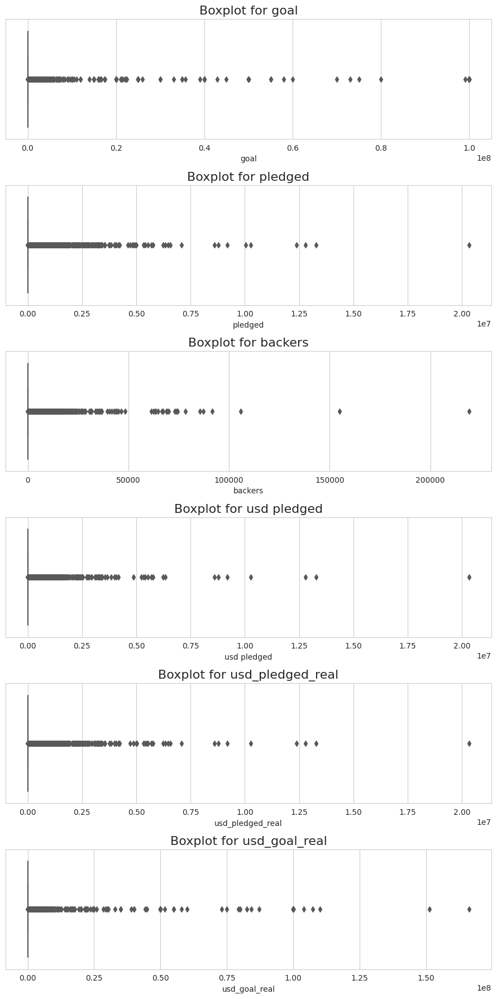

In [22]:
fig, axes = plt.subplots(6, 1, figsize=(9, 18))

numerical_features = [
   'goal','pledged', 'backers', 'usd pledged', 'usd_pledged_real', 'usd_goal_real'
]

#Looping through the subplots and create countplots for each feature
for i, ax in enumerate(axes.flat):
    if i < len(numerical_features):
        sns.boxplot(data=df, x=numerical_features[i], ax=ax, palette='Set2', orient='h')
        ax.set_title(f'Boxplot for {numerical_features[i]}', fontsize=16)

# Adjusting the layout for better visualization
plt.tight_layout()

plt.show()

The boxplot for the numerical column shows the presence of significant outliers in the dataset. These outliers align with the overall trends of the dataset and are not data errors. However, to optimize our model, it is advisable to either remove or minimize these outliers.